In [1]:
#from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.pyplot as plt
from matplotlib import animation
import numpy as np
import testgen

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300
mpl.rcParams["animation.html"] = "jshtml"
mpl.rcParams["animation.embed_limit"] = 100

In [2]:
DEMO_ROWS = 4
DEMO_COLS = 2

In [3]:
def draw_triangle(subplot, triangle, color):
    draw = triangle.copy()
    draw = np.concatenate((draw, [draw[0]]))
    
    xs = draw[:, 0]
    ys = draw[:, 1]
    zs = draw[:, 2]
    
    return subplot.plot(xs, ys, zs, color=color)

In [4]:
def draw_example(subplot, generator):
    base = testgen.create_base()
    triangle, points = testgen.gen3D(generator)
    p1, p2 = points
    
    xs = [p1[0], p2[0]]
    ys = [p1[1], p2[1]]
    
    subplot.set_xlim(*testgen.xlim())
    subplot.set_ylim(*testgen.ylim())
    subplot.set_zlim(*testgen.zlim())

    X, Y = np.meshgrid(np.arange(*testgen.ylim()), np.arange(*testgen.ylim()))
    Z = 0*X
    
    p = subplot.plot_surface(X, Y, Z, alpha=0.1) # the horizontal plane
    
    b = draw_triangle(subplot, base, "blue")
    t = draw_triangle(subplot, triangle, "orange")
    l = subplot.plot(xs, ys, "ro--", zorder=2)
    return p, b[0], t[0], l[0]

In [5]:
def draw_demo(generator):
    fig = plt.figure(figsize=(20,20))
    
    for i in range(DEMO_ROWS):
        for k in range(DEMO_COLS):
            subplot = fig.add_subplot(DEMO_ROWS, DEMO_COLS, i*DEMO_COLS + k + 1, projection='3d')
            draw_example(subplot, generator)
    
    plt.show()

In [6]:
def animate_demo(generator):
    fig = plt.figure(figsize=(20,20))
    
    subplots = []
    
    for i in range(DEMO_ROWS):
        for k in range(DEMO_COLS):
            subplot = fig.add_subplot(DEMO_ROWS, DEMO_COLS, i*DEMO_COLS + k + 1, projection='3d')
            data = draw_example(subplot, generator)
            subplots.append((subplot, data))
    
    def animate(i):
        datas = []
        for subplot, data in subplots:
            subplot.view_init(elev=20, azim=i*36)
            datas.extend(data)
        return datas
    
    anim = animation.FuncAnimation(fig, animate, frames=10, interval=200, blit=True)
    return anim

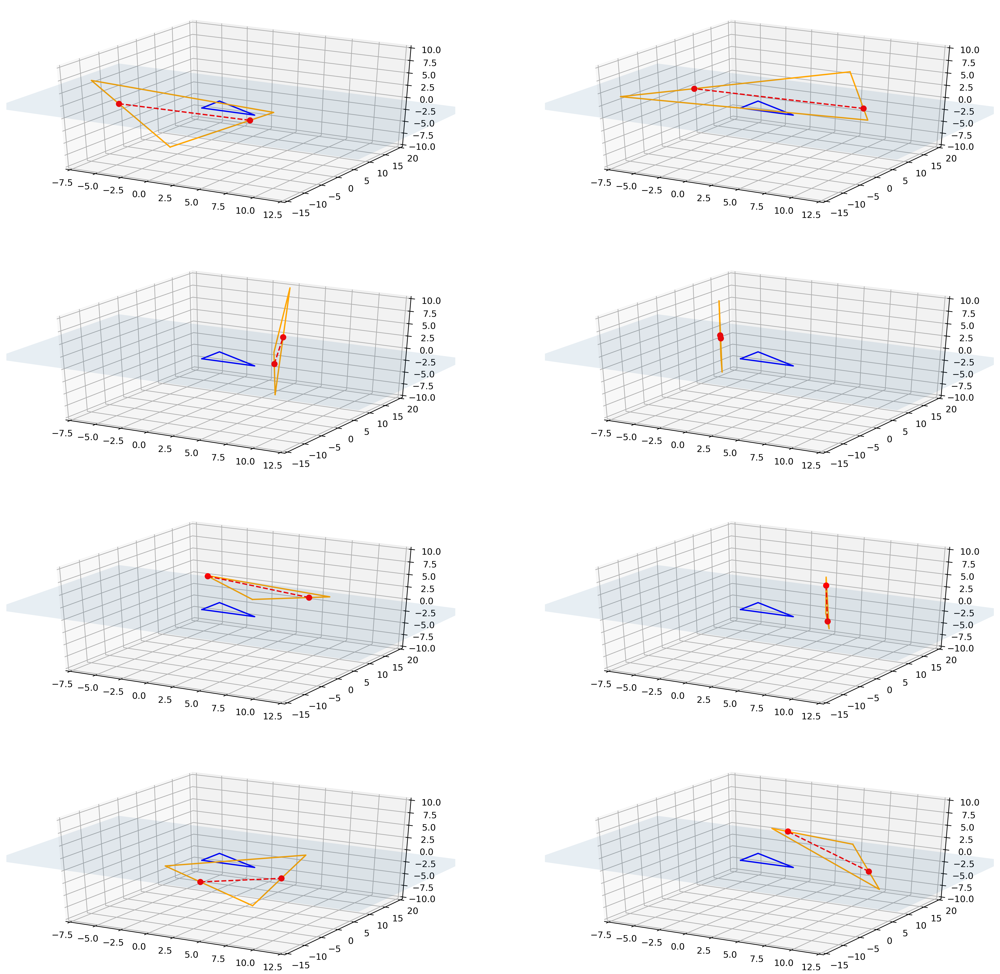

In [7]:
draw_demo(testgen.B1)

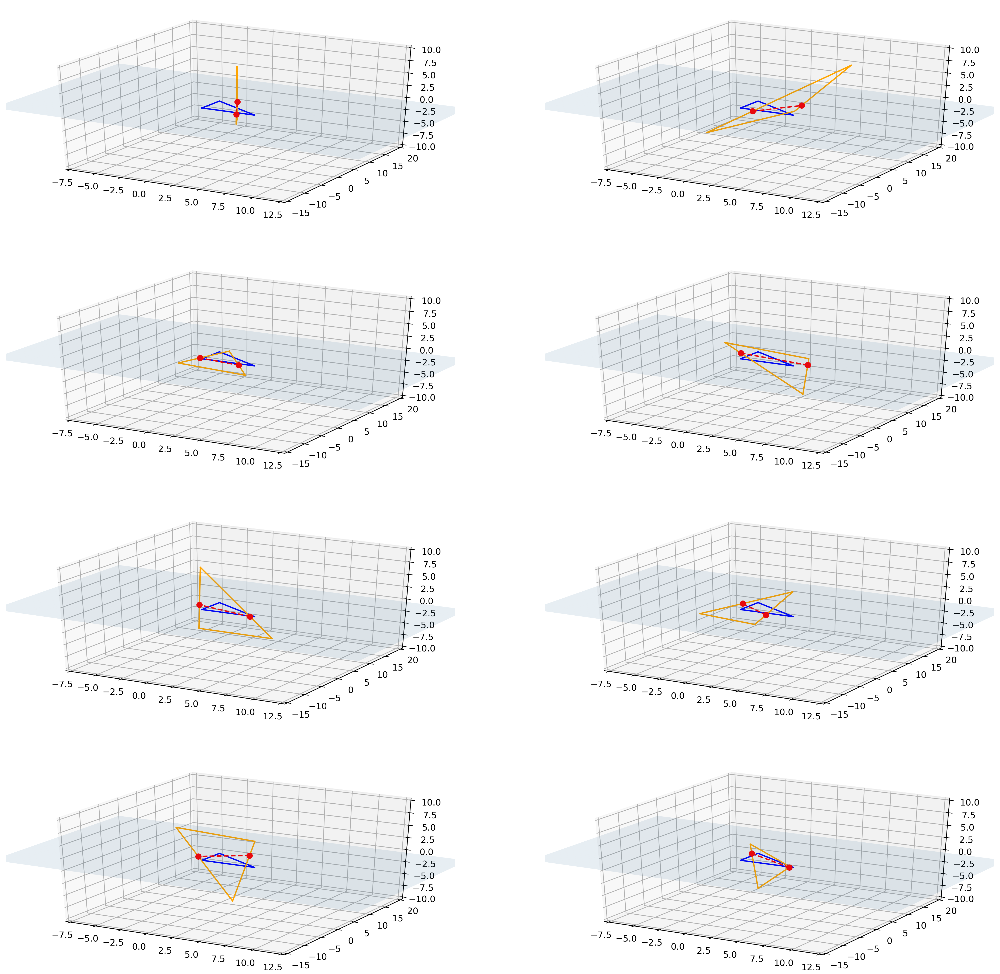

In [8]:
draw_demo(testgen.B2)

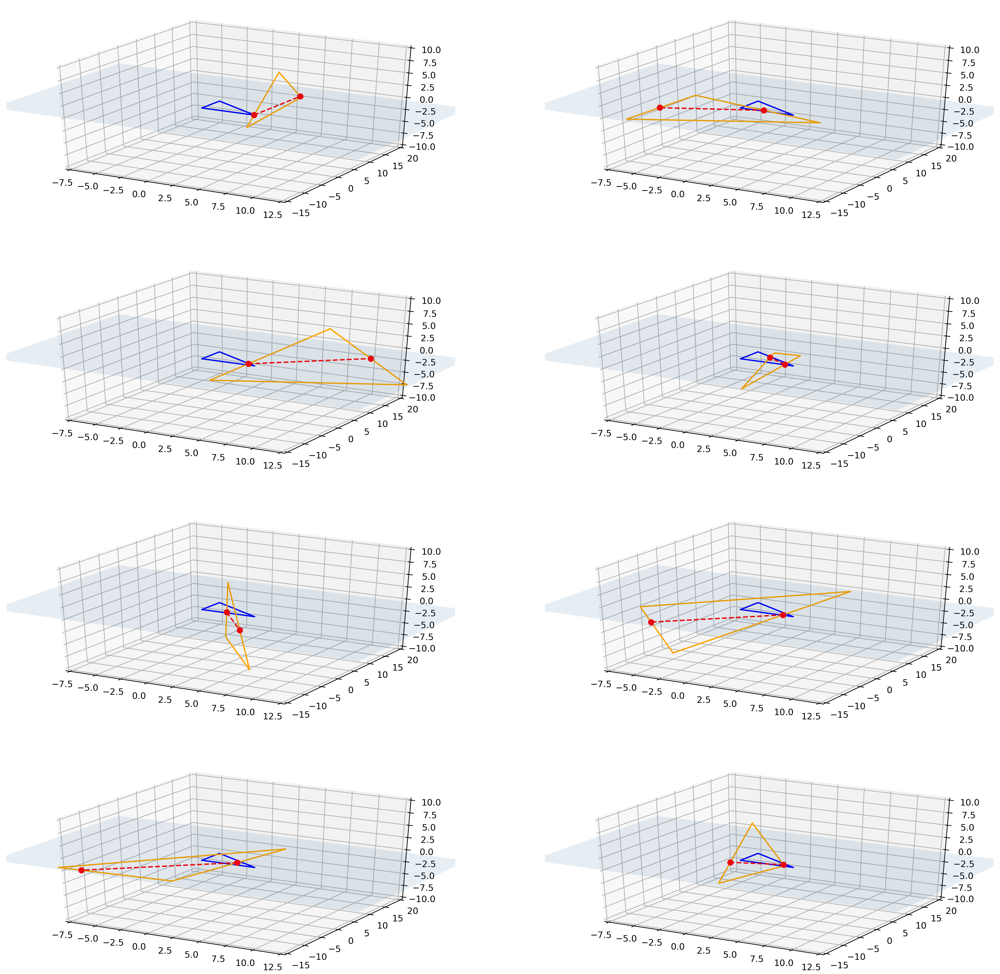

In [9]:
draw_demo(testgen.B3)

In [ ]:
animate_demo(testgen.B1)

In [ ]:
animate_demo(testgen.B2)

In [ ]:
animate_demo(testgen.B3)